# Import Library

In [162]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import ticker
from sklearn.tree import DecisionTreeRegressor

# Read CSV

In [163]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

In [164]:
df_train.shape

(14073, 8)

In [165]:
df_test.shape

(3519, 8)

# Plot Data

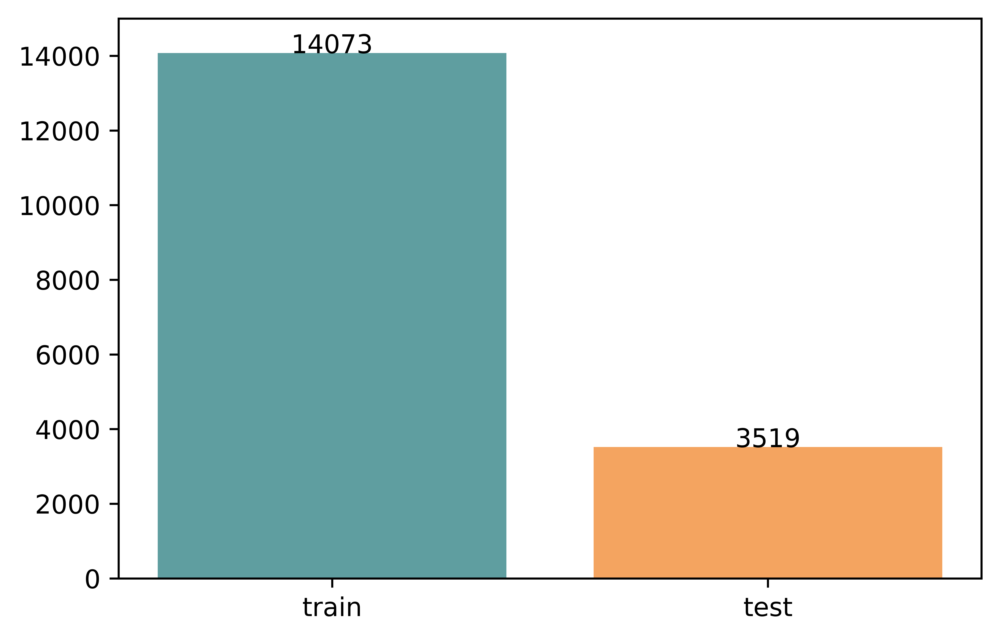

In [166]:
# Values to be plotted
values = [df_train.shape[0], df_test.shape[0]]
labels = ['train', 'test']

# Create barplot
plt.bar(labels, values, color=['cadetblue', 'sandybrown'])
plt.gcf().set_dpi(1000)
plt.ylim(0, 15000)

# Annotate bars with the value above them
for i, value in enumerate(values):
    plt.text(i, value, str(value), ha='center')

# Show plot
plt.show()


# Set timestamp as index

In [167]:
df_train = df_train.set_index('timestamp')
df_train

,DAY,MONTH,YEAR,DAY OR NIGHT,IS WEEKDAY,IS HOLIDAY,usage
timestamp,,,,,,,
2016-10-22 00:00:00,22,10,2016,0,0,0,0.04
2016-10-22 01:00:00,22,10,2016,0,0,0,0.04
2016-10-22 02:00:00,22,10,2016,0,0,0,0.08
2016-10-22 03:00:00,22,10,2016,0,0,0,0.04
2016-10-22 04:00:00,22,10,2016,0,0,0,0.04
...,...,...,...,...,...,...,...
2018-05-31 04:00:00,31,5,2018,0,1,0,0.16
2018-05-31 05:00:00,31,5,2018,0,1,0,0.20
2018-05-31 06:00:00,31,5,2018,1,1,0,0.16


In [168]:
df_test = df_test.set_index('timestamp')
df_test

,DAY,MONTH,YEAR,DAY OR NIGHT,IS WEEKDAY,IS HOLIDAY,usage
timestamp,,,,,,,
2018-05-31 09:00:00,31,5,2018,1,1,0,0.28
2018-05-31 10:00:00,31,5,2018,1,1,0,0.24
2018-05-31 11:00:00,31,5,2018,1,1,0,0.32
2018-05-31 12:00:00,31,5,2018,1,1,0,0.28
2018-05-31 13:00:00,31,5,2018,1,1,0,0.28
...,...,...,...,...,...,...,...
2018-10-24 19:00:00,24,10,2018,0,1,0,0.12
2018-10-24 20:00:00,24,10,2018,0,1,0,0.12
2018-10-24 21:00:00,24,10,2018,0,1,0,0.12


# Data Description

In [169]:
df_train.describe()

,DAY,MONTH,YEAR,DAY OR NIGHT,IS WEEKDAY,IS HOLIDAY,usage
count,14073.000000,14073.000000,14073.000000,14073.000000,14073.000000,14073.000000,14073.000000
mean,15.866340,6.200597,2017.135366,0.499893,0.713494,0.034108,0.513127
std,8.821124,3.715611,0.599361,0.500018,0.452145,0.181513,0.915873
min,1.000000,1.000000,2016.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,3.000000,2017.000000,0.000000,0.000000,0.000000,0.120000
50%,16.000000,5.000000,2017.000000,0.000000,1.000000,0.000000,0.200000
75%,24.000000,10.000000,2018.000000,1.000000,1.000000,0.000000,0.480000
max,31.000000,12.000000,2018.000000,1.000000,1.000000,1.000000,9.440000


In [170]:
X_train = df_train.drop(['usage'],axis=1)
y_train = df_train.iloc[:,-1:]
X_test = df_test.drop(['usage'],axis=1)
y_test = df_test.iloc[:,-1:]

In [171]:
X_train

,DAY,MONTH,YEAR,DAY OR NIGHT,IS WEEKDAY,IS HOLIDAY
timestamp,,,,,,
2016-10-22 00:00:00,22,10,2016,0,0,0
2016-10-22 01:00:00,22,10,2016,0,0,0
2016-10-22 02:00:00,22,10,2016,0,0,0
2016-10-22 03:00:00,22,10,2016,0,0,0
2016-10-22 04:00:00,22,10,2016,0,0,0
...,...,...,...,...,...,...
2018-05-31 04:00:00,31,5,2018,0,1,0
2018-05-31 05:00:00,31,5,2018,0,1,0
2018-05-31 06:00:00,31,5,2018,1,1,0


In [172]:
y_train

,usage
timestamp,
2016-10-22 00:00:00,0.04
2016-10-22 01:00:00,0.04
2016-10-22 02:00:00,0.08
2016-10-22 03:00:00,0.04
2016-10-22 04:00:00,0.04
...,...
2018-05-31 04:00:00,0.16
2018-05-31 05:00:00,0.20
2018-05-31 06:00:00,0.16


In [173]:
X_test

,DAY,MONTH,YEAR,DAY OR NIGHT,IS WEEKDAY,IS HOLIDAY
timestamp,,,,,,
2018-05-31 09:00:00,31,5,2018,1,1,0
2018-05-31 10:00:00,31,5,2018,1,1,0
2018-05-31 11:00:00,31,5,2018,1,1,0
2018-05-31 12:00:00,31,5,2018,1,1,0
2018-05-31 13:00:00,31,5,2018,1,1,0
...,...,...,...,...,...,...
2018-10-24 19:00:00,24,10,2018,0,1,0
2018-10-24 20:00:00,24,10,2018,0,1,0
2018-10-24 21:00:00,24,10,2018,0,1,0


In [174]:
y_test

,usage
timestamp,
2018-05-31 09:00:00,0.28
2018-05-31 10:00:00,0.24
2018-05-31 11:00:00,0.32
2018-05-31 12:00:00,0.28
2018-05-31 13:00:00,0.28
...,...
2018-10-24 19:00:00,0.12
2018-10-24 20:00:00,0.12
2018-10-24 21:00:00,0.12


# Predicting 1: all data

In [175]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

regressor = DecisionTreeRegressor(random_state=42)
regressor.fit(X_train, y_train)
y = regressor.predict(X_test)

In [176]:
print(regressor.get_params())

{'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 42, 'splitter': 'best'}


In [177]:
plt.figure(figsize=(15, 10))
plt.gcf().set_dpi(1000)
plot_tree(regressor, filled=True, feature_names=X_train.columns, rounded=True, fontsize=10)
plt.show()

## Feature Importance

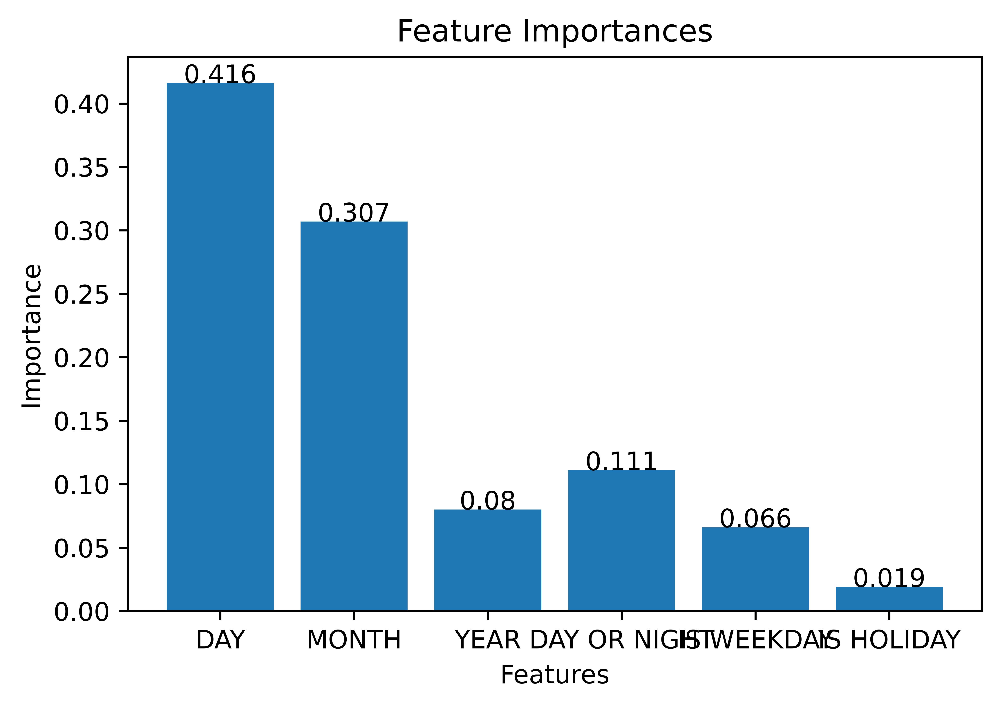

In [178]:
feature_importances = regressor.feature_importances_

# Plot feature importances
fi = [round(x, 3) for x in feature_importances]
plt.bar(range(len(fi)), fi, tick_label=X_train.columns)
plt.gcf().set_dpi(1000)
for i, value in enumerate(fi):
    plt.text(i, value, str(value), ha='center')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()

## Predicted

In [179]:
y

array([0.82666667, 0.82666667, 0.82666667, ..., 0.47666667, 0.47666667,
       0.47666667])

## RMSE

In [180]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from math import sqrt

rmse = sqrt(mean_squared_error(y_test, y))
# acc = accuracy_score(y_test, y)
rmse

0.4556515954462342

In [183]:
len(set(y))

127

In [184]:
y.shape[0]

3519

## Plotting actual vs predicted

In [185]:
y_test = y_test.sort_index()  # Make sure the index is sorted
y_df = pd.DataFrame({'usage': y}, index=y_test.index)
y_df

,usage
timestamp,
2018-05-31 09:00:00,0.826667
2018-05-31 10:00:00,0.826667
2018-05-31 11:00:00,0.826667
2018-05-31 12:00:00,0.826667
2018-05-31 13:00:00,0.826667
...,...
2018-10-24 19:00:00,0.476667
2018-10-24 20:00:00,0.476667
2018-10-24 21:00:00,0.476667


In [186]:
plt.figure(figsize=(20, 8))
plt.gcf().set_dpi(1000)
plt.plot(y_test.index, y_test['usage'], label='Actual', color='blue')
plt.plot(y_test.index, y_df['usage'], label='Predicted', linestyle='dashed', color='orange')
plt.xlabel('Timestamp')
plt.ylabel('Electricity Usage')
plt.title('Actual vs. Predicted Electricity Usage')
plt.xticks(y_df.index[::100], rotation=45, ha='right')
plt.legend()
plt.show()

In [187]:
y_test

,usage
timestamp,
2018-05-31 09:00:00,0.28
2018-05-31 10:00:00,0.24
2018-05-31 11:00:00,0.32
2018-05-31 12:00:00,0.28
2018-05-31 13:00:00,0.28
...,...
2018-10-24 19:00:00,0.12
2018-10-24 20:00:00,0.12
2018-10-24 21:00:00,0.12


# Prediction 2: Take few for examples (to be presented)

## Take 2 columns only

In [188]:
df_train2 = pd.read_csv('train.csv')
df_test2 = pd.read_csv('test.csv')
df_train2 = df_train2.set_index('timestamp')
df_test2 = df_test2.set_index('timestamp')

X_train2 = df_train2[['IS HOLIDAY','IS WEEKDAY']]
y_train2 = df_train2.iloc[:,-1:]

X_test2 = df_test2[['IS HOLIDAY','IS WEEKDAY']]
y_test2 = df_test2.iloc[:,-1:]

## Prediction

In [189]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

regressor2 = DecisionTreeRegressor()
regressor2.fit(X_train2, y_train2)
y2 = regressor2.predict(X_test2)

In [190]:
print(regressor2.get_params())

{'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


In [191]:
print(regressor2)

DecisionTreeRegressor()


## Tree

In [192]:
plt.figure(figsize=(15, 10))
plt.gcf().set_dpi(1000)
plot_tree(regressor2, filled=True, feature_names=X_train2.columns, rounded=True, fontsize=10)
plt.show()

## RMSE

In [193]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from math import sqrt

rmse = sqrt(mean_squared_error(y_test2, y2))
# acc = accuracy_score(y_test, y)
rmse

0.4378171265396203

## Custom input

In [194]:
x_test_input = pd.DataFrame({'timestamp':['2018-10-25 00:00:00'],'IS HOLIDAY':[1], 'IS WEEKDAY':[1]})
x_test_input['timestamp'] = pd.to_datetime(x_test_input['timestamp'])
x_test_input = x_test_input.set_index('timestamp')
x_test_input

,IS HOLIDAY,IS WEEKDAY
timestamp,,
2018-10-25,1,1


In [195]:
regressor2.predict(x_test_input)

array([0.76421569])